#I. Import and overview of data 

In [1]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
# import wandb
# from wandb.keras import WandbCallback


In [2]:
#Import training dataset (df)
train_set = pd.read_csv('C:/Users/pmh1407/Downloads/WIDS/TrainingWiDS2021.csv',index_col=False)

#Import testing dataset or unlabelled dataset (test)
test_set = pd.read_csv('C:/Users/pmh1407/Downloads/WIDS/UnlabeledWiDS2021.csv')

# Copy datasets
train_df= train_set.copy(deep=True)
test_df=test_set.copy(deep=True)

In [3]:
random.seed(32)

In [4]:
#Set the console bigger
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:20,.2f}'.format)
pd.set_option('display.max_colwidth', None)

In [5]:
train_df.T.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,130057,130058,130059,130060,130061,130062,130063,130064,130065,130066,130067,130068,130069,130070,130071,130072,130073,130074,130075,130076,130077,130078,130079,130080,130081,130082,130083,130084,130085,130086,130087,130088,130089,130090,130091,130092,130093,130094,130095,130096,130097,130098,130099,130100,130101,130102,130103,130104,130105,130106,130107,130108,130109,130110,130111,130112,130113,130114,130115,130116,130117,130118,130119,130120,130121,130122,130123,130124,130125,130126,130127,130128,130129,130130,130131,130132,130133,130134,130135,130136,130137,130138,130139,130140,130141,130142,130143,130144,130145,130146,130147,130148,130149,130150,130151,130152,130153,130154,130155,130156
Unnamed: 0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,...,130058,130059,130060,130061,130062,130063,130064,130065,130066,130067,130068,130069,130070,130071,130072,130073,130074,130075,130076,130077,130078,130079,130080,130081,130082,130083,130084,130085,130086,130087,130088,130089,130090,130091,130092,130093,130094,130095,130096,130097,130098,130099,130100,130101,130102,130103,130104,130105,130106,130107,130108,130109,130110,130111,130112,130113,130114,130115,130116,130117,130118,130119,130120,130121,130122,130123,130124,130125,130126,130127,130128,130129,130130,130131,130132,130133,130134,130135,130136,130137,130138,130139,130140,130141,130142,130143,130144,130145,130146,130147,130148,130149,130150,130151,130152,130153,130154,130155,130156,130157
encounter_id,214826,246060,276985,262220,201746,182697,195124,179261,271041,238874,260801,268720,203469,172526,187995,239271,221028,221758,178745,242567,214869,195396,184729,198947,163729,172358,228650,222048,265580,180330,242752,190593,218108,244158,255887,238278,234565,235326,273321,198305,260161,152924,177332,179524,203791,264641,254433,184214,175784,195469,207001,156311,210326,163581,221238,233204,251239,258963,160272,204283,151386,149300,174919,254613,213965,236690,272964,224457,252442,167704,172487,269123,185794,176487,249327,262830,197030,248969,255893,254889,267812,256266,194140,156975,231602,192319,258530,190875,198395,218281,238296,174170,151653,236578,210152,151917,184380,274762,172824,266945,...,156472,199152,238470,169071,266361,165870,147881,244455,148425,157655,153245,197274,219447,177563,254146,244368,258285,182965,182416,234692,155121,199195,229217,221540,210506,251483,273053,209837,166909,173198,221264,194611,184310,238003,157098,172306,254081,255187,274369,167989,255471,210457,186880,278722,154696,266781,272025,154951,267474,231436,186152,195669,251350,169711,258888,251130,167149,241617,207816,176926,250784,260519,210670,237897,254338,224156,273935,245413,237028,205833,268769,266181,207329,269593,253246,276511,246917,196317,268048,211844,250792,248330,200062,258430,239532,248563,219686,216193,198342,179314,153801,255318,229244,244053,147574,164758,197653,219719,222562,157942
hospital_id,118,81,118,118,33,83,83,33,118,118,77,83,118,118,118,118,81,118,118,118,83,118,81,118,77,118,118,33,118,118,77,83,77,118,81,118,118,149,118,118,149,77,33,31,118,83,118,151,118,69,149,118,118,118,118,83,118,81,81,46,118,151,118,118,118,118,118,83,118,83,31,83,118,118,151,77,149,69,46,81,118,149,118,118,118,118,83,81,83,46,118,77,118,149,83,31,81,83,83,118,...,7,7,7,7,7,7,7,7,7,7,7,7,170,170,7,170,7,7,7,7,7,170,170,7,7,7,7,7,7,7,7,7,7,7,170,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,170,7,170,7,7,7,7,7,170,7,7,7,7,7,170,7,7,7,7,170,170,170,7,170,7,7,7,7,7,7,7,7,

In [6]:
train_df.T.tail(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,130057,130058,130059,130060,130061,130062,130063,130064,130065,130066,130067,130068,130069,130070,130071,130072,130073,130074,130075,130076,130077,130078,130079,130080,130081,130082,130083,130084,130085,130086,130087,130088,130089,130090,130091,130092,130093,130094,130095,130096,130097,130098,130099,130100,130101,130102,130103,130104,130105,130106,130107,130108,130109,130110,130111,130112,130113,130114,130115,130116,130117,130118,130119,130120,130121,130122,130123,130124,130125,130126,130127,130128,130129,130130,130131,130132,130133,130134,130135,130136,130137,130138,130139,130140,130141,130142,130143,130144,130145,130146,130147,130148,130149,130150,130151,130152,130153,130154,130155,130156
d1_arterial_po2_max,NaN,51.0,NaN,337.0,NaN,NaN,370.0,89.0,256.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,141.0,NaN,174.0,NaN,NaN,NaN,77.0,NaN,283.0,NaN,NaN,104.0,NaN,NaN,84.0,NaN,NaN,NaN,NaN,NaN,NaN,85.0,NaN,NaN,140.0,NaN,175.0,NaN,NaN,167.0,136.0,NaN,373.0,NaN,257.0,119.0,NaN,124.0,NaN,NaN,NaN,NaN,NaN,NaN,195.0,NaN,233.0,105.0,237.0,115.0,NaN,NaN,104.0,NaN,NaN,NaN,NaN,131.0,NaN,NaN,66.0,NaN,NaN,381.0,NaN,173.0,NaN,NaN,NaN,61.0,NaN,NaN,NaN,118.0,NaN,NaN,NaN,NaN,NaN,NaN,136.0,NaN,NaN,...,NaN,244.0,107.0,NaN,179.0,365.0,NaN,NaN,NaN,NaN,329.0,NaN,NaN,NaN,NaN,NaN,NaN,485.0,95.0,194.0,99.0,NaN,NaN,NaN,NaN,139.0,NaN,540.87,271.0,154.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,215.0,108.0,116.0,NaN,NaN,213.0,NaN,NaN,NaN,184.0,NaN,180.0,NaN,NaN,NaN,86.0,NaN,NaN,85.0,68.0,NaN,77.0,NaN,108.0,NaN,NaN,470.0,NaN,382.0,NaN,209.0,NaN,NaN,NaN,378.0,NaN,78.0,NaN,NaN,NaN,93.0,NaN,91.0,NaN,85.0,162.0,NaN,NaN,NaN,NaN,389.0,87.0,NaN,89.0,207.0,380.0,108.0,226.0,NaN,NaN,163.0,NaN,NaN
d1_arterial_po2_min,NaN,51.0,NaN,102.0,NaN,NaN,370.0,89.0,92.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,141.0,NaN,80.0,NaN,NaN,NaN,77.0,NaN,55.0,NaN,NaN,104.0,NaN,NaN,84.0,NaN,NaN,NaN,NaN,NaN,NaN,85.0,NaN,NaN,78.0,NaN,131.0,NaN,NaN,167.0,59.0,NaN,46.0,NaN,69.0,67.0,NaN,124.0,NaN,NaN,NaN,NaN,NaN,NaN,123.0,NaN,233.0,49.0,86.0,89.0,NaN,NaN,104.0,NaN,NaN,NaN,NaN,69.0,NaN,NaN,66.0,NaN,NaN,183.0,NaN,72.0,NaN,NaN,NaN,61.0,NaN,NaN,NaN,47.0,NaN,NaN,NaN,NaN,NaN,NaN,117.0,NaN,NaN,...,NaN,50.0,76.0,NaN,168.0,84.0,NaN,NaN,NaN,NaN,118.0,NaN,NaN,NaN,NaN,NaN,NaN,104.0,95.0,107.0,79.0,NaN,NaN,NaN,NaN,59.0,NaN,112.0,67.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0,108.0,116.0,NaN,NaN,72.0,NaN,NaN,NaN,132.0,NaN,95.0,NaN,NaN,NaN,40.0,NaN,NaN,85.0,68.0,NaN,77.0,NaN,95.0,NaN,NaN,171.0,NaN,99.0,NaN,98.0,NaN,NaN,NaN,118.0,NaN,78.0,NaN,NaN,NaN,58.0,NaN,82.0,NaN,34.0,93.0,NaN,NaN,NaN,NaN,74.0,87.0,NaN,82.0,50.0,193.0,108.0,89.0,NaN,NaN,80.0,NaN,NaN
d1_pao2fio2ratio_max,NaN,54.8,NaN,342.5,NaN,NaN,370.0,NaN,92.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,352.5,NaN,337.5,NaN,NaN,NaN,275.0,NaN,283.0,NaN,NaN,260.0,NaN,NaN,233.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,379.17,NaN,583.33,NaN,NaN,417.5,272.0,NaN,NaN,NaN,298.84,255.56,NaN,310.0,NaN,NaN,NaN,NaN,NaN,NaN,325.0,NaN,466.0,210.0,422.5,328.57,NaN,NaN,260.0,NaN,NaN,NaN,NaN,131.0,NaN,NaN,220.0,NaN,NaN,415.91,NaN,303.57,NaN,NaN,NaN,244.0,NaN,NaN,NaN,236.0,NaN,NaN,NaN,NaN,NaN,NaN,340.0,NaN,NaN,...,NaN,244.0,267.5,NaN,480.0,NaN,NaN,NaN,NaN,NaN,329.0,NaN,NaN,NaN,NaN,NaN,NaN,485.0,452.38,485.0,141.43,NaN,NaN,NaN,NaN,139.0,NaN,579.0,432.0,154.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,268.75,216.0,165.71,NaN,NaN,213.0,NaN,NaN,NaN,460.0,NaN,247.5,NaN,NaN,NaN,286.67,NaN,NaN,303.57,69.39,NaN,240.62,NaN,237.5,NaN,NaN,388.64,NaN,364.0,NaN,522.5,NaN,NaN,NaN,378.0,NaN,278.57,NaN,NaN,NaN,88.0,NaN,182.0,NaN,404.76,270.0,NaN,NaN,NaN,NaN,389.0,145.0,NaN,370.83,258.75,380.0,240.0,300.0,NaN,NaN,163.0,NaN,NaN
d1_pao2fio2ratio_min,NaN,51.0,NaN,236.67,NaN,NaN,370.0,NaN,92.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,352.5,NaN,161.0,NaN,NaN,NaN,275.0,NaN,101.43,NaN,Na

In [7]:
test_df.T.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,10134,10135,10136,10137,10138,10139,10140,10141,10142,10143,10144,10145,10146,10147,10148,10149,10150,10151,10152,10153,10154,10155,10156,10157,10158,10159,10160,10161,10162,10163,10164,10165,10166,10167,10168,10169,10170,10171,10172,10173,10174,10175,10176,10177,10178,10179,10180,10181,10182,10183,10184,10185,10186,10187,10188,10189,10190,10191,10192,10193,10194,10195,10196,10197,10198,10199,10200,10201,10202,10203,10204,10205,10206,10207,10208,10209,10210,10211,10212,10213,10214,10215,10216,10217,10218,10219,10220,10221,10222,10223,10224,10225,10226,10227,10228,10229,10230,10231,10232,10233
Unnamed: 0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,...,10135,10136,10137,10138,10139,10140,10141,10142,10143,10144,10145,10146,10147,10148,10149,10150,10151,10152,10153,10154,10155,10156,10157,10158,10159,10160,10161,10162,10163,10164,10165,10166,10167,10168,10169,10170,10171,10172,10173,10174,10175,10176,10177,10178,10179,10180,10181,10182,10183,10184,10185,10186,10187,10188,10189,10190,10191,10192,10193,10194,10195,10196,10197,10198,10199,10200,10201,10202,10203,10204,10205,10206,10207,10208,10209,10210,10211,10212,10213,10214,10215,10216,10217,10218,10219,10220,10221,10222,10223,10224,10225,10226,10227,10228,10229,10230,10231,10232,10233,10234
encounter_id,144740,141990,142038,138628,141682,139096,142994,141954,135344,142552,139615,137192,136646,136743,142796,144221,142386,143986,138841,139727,136176,138687,143239,142837,144611,138178,139856,140572,145743,137132,135267,138918,144372,145818,144248,139633,144929,142828,135759,138084,145715,145372,145900,139418,145865,142966,142043,135565,139597,142866,138887,139833,141090,144320,138192,139800,143331,138840,144730,138639,136776,138286,140744,138463,143233,145411,145699,145833,135018,140882,144467,136997,137055,144562,140678,145313,135458,143647,139601,135904,144747,142119,145709,137038,136818,138992,141535,140361,145531,144765,145993,142398,142191,144182,145876,144922,140476,143445,135513,137251,...,144141,142199,139959,144409,145726,141100,139247,140566,140267,138817,138211,141725,138807,138468,140185,144563,145907,136134,145043,140331,145613,145462,144452,135425,140376,143859,138195,142740,143941,137569,138415,135912,144895,141812,137091,140992,137583,141540,143290,145298,142729,138976,138236,145505,144281,140336,136324,141461,143406,143130,136954,135306,143991,139402,139187,143148,142670,140271,145168,142946,136003,135265,143031,143642,141477,143498,140817,139409,138592,144437,137893,145146,138322,139931,136469,140138,138553,138035,143417,140471,139140,137162,144092,141122,142393,145131,143911,141192,143208,144016,138612,140398,143763,135453,140047,143750,143813,137126,135652,136852
hospital_id,10141,10141,10141,10141,10141,10141,10141,10141,10141,10141,10141,10141,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10104,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10181,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10064,10105,10105,10105,10105,10105,10105,10105,10105,10105,10105,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,10166,...,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,10078,100

In [8]:
test_df.T.tail(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,10134,10135,10136,10137,10138,10139,10140,10141,10142,10143,10144,10145,10146,10147,10148,10149,10150,10151,10152,10153,10154,10155,10156,10157,10158,10159,10160,10161,10162,10163,10164,10165,10166,10167,10168,10169,10170,10171,10172,10173,10174,10175,10176,10177,10178,10179,10180,10181,10182,10183,10184,10185,10186,10187,10188,10189,10190,10191,10192,10193,10194,10195,10196,10197,10198,10199,10200,10201,10202,10203,10204,10205,10206,10207,10208,10209,10210,10211,10212,10213,10214,10215,10216,10217,10218,10219,10220,10221,10222,10223,10224,10225,10226,10227,10228,10229,10230,10231,10232,10233
d1_arterial_ph_min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.05,NaN,NaN,NaN,7.43,7.54,NaN,NaN,7.45,7.23,7.17,7.22,NaN,7.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.07,NaN,NaN,NaN,NaN,7.3,NaN,NaN,NaN,NaN,NaN,7.36,NaN,7.13,NaN,NaN,NaN,NaN,7.4,7.32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.29,NaN,NaN,NaN,NaN,7.2,NaN,7.35,NaN,NaN,NaN,7.05,NaN,NaN,7.52,NaN,7.0,NaN,NaN,7.37,NaN,NaN,NaN,NaN,7.33,NaN,NaN,NaN,7.27,7.34,NaN,NaN,6.92,...,NaN,7.38,7.42,NaN,7.3,7.32,7.31,7.26,7.32,NaN,NaN,NaN,NaN,NaN,NaN,7.43,NaN,7.4,NaN,NaN,NaN,NaN,NaN,NaN,7.35,7.33,NaN,7.22,NaN,NaN,NaN,7.37,NaN,NaN,7.31,NaN,NaN,7.31,NaN,7.31,7.26,NaN,NaN,7.37,NaN,NaN,NaN,NaN,NaN,7.29,NaN,NaN,7.41,7.34,7.32,NaN,7.4,NaN,NaN,NaN,NaN,7.29,NaN,NaN,NaN,NaN,NaN,7.33,7.14,7.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.46,NaN,NaN,NaN,NaN,NaN,7.28,NaN,NaN,NaN,NaN,NaN,7.39,7.53,7.21,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
d1_arterial_po2_max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,216.0,NaN,NaN,NaN,95.0,81.0,NaN,NaN,65.0,69.0,199.0,141.0,NaN,120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,382.0,NaN,NaN,NaN,NaN,180.0,NaN,NaN,NaN,NaN,NaN,122.0,NaN,183.0,NaN,NaN,NaN,NaN,130.0,118.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,348.0,NaN,NaN,NaN,NaN,259.0,NaN,43.0,NaN,NaN,NaN,275.0,NaN,NaN,102.0,NaN,214.0,NaN,NaN,93.0,NaN,NaN,NaN,NaN,91.0,NaN,NaN,NaN,359.0,286.0,NaN,NaN,196.0,...,NaN,401.0,196.0,NaN,548.01,80.0,132.0,259.0,315.0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,NaN,149.0,NaN,NaN,NaN,NaN,NaN,NaN,307.0,143.0,NaN,160.0,NaN,NaN,NaN,231.0,NaN,NaN,436.0,NaN,NaN,147.0,NaN,326.0,137.0,NaN,NaN,227.0,NaN,NaN,NaN,NaN,NaN,123.0,NaN,NaN,121.0,328.0,427.0,NaN,59.0,NaN,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,325.0,548.01,159.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,213.0,NaN,NaN,NaN,NaN,NaN,149.0,NaN,NaN,NaN,NaN,NaN,66.0,88.0,162.0,74.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
d1_arterial_po2_min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.0,NaN,NaN,NaN,52.0,60.0,NaN,NaN,65.0,62.0,199.0,64.0,NaN,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,70.0,NaN,NaN,NaN,NaN,NaN,95.0,NaN,104.0,NaN,NaN,NaN,NaN,114.0,111.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,143.0,NaN,NaN,NaN,NaN,63.0,NaN,43.0,NaN,NaN,NaN,67.0,NaN,NaN,67.0,NaN,71.0,NaN,NaN,93.0,NaN,NaN,NaN,NaN,58.0,NaN,NaN,NaN,140.0,131.0,NaN,NaN,80.0,...,NaN,181.0,192.0,NaN,78.0,78.0,47.0,85.0,81.0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,NaN,52.0,NaN,NaN,NaN,NaN,NaN,NaN,122.0,67.0,NaN,80.0,NaN,NaN,NaN,88.0,NaN,NaN,75.0,NaN,NaN,124.0,NaN,73.0,52.0,NaN,NaN,125.0,NaN,NaN,NaN,NaN,NaN,65.0,NaN,NaN,121.0,103.0,111.0,NaN,59.0,NaN,NaN,NaN,NaN,63.0,NaN,NaN,NaN,NaN,NaN,169.0,88.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118.0,NaN,NaN,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,66.0,77.0,58.0,56.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
d1_pao2fio2ratio_max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,216.0,NaN,NaN,NaN,253.6,222.2,NaN,NaN,309.5,124.0,NaN,213.3,NaN,303.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,844.09,NaN,NaN,NaN,NaN,300.0,NaN,NaN,NaN,NaN,NaN,272.5,NaN,305.0,NaN,NaN,NaN,NaN,285.0,111.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,357.5,NaN,NaN,NaN,NaN,234.3,NaN,86.0,NaN,NaN,NaN,275.0,NaN,NaN,255.0,NaN,300.0,NaN,NaN,2

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130157 entries, 0 to 130156
Columns: 181 entries, Unnamed: 0 to diabetes_mellitus
dtypes: float64(157), int64(18), object(6)
memory usage: 179.7+ MB


In [10]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10234 entries, 0 to 10233
Columns: 180 entries, Unnamed: 0 to solid_tumor_with_metastasis
dtypes: float64(156), int64(18), object(6)
memory usage: 14.1+ MB


In [11]:
# !pip install pandas_summary
from pandas_summary import DataFrameSummary
dfs = DataFrameSummary(train_df)
dfs.summary()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
count,"130,157.0","130,157.0","130,157.0","125,169.0","125,667.0","130,157.0",NaN,NaN,"128,080.0",NaN,NaN,"130,157.0",NaN,NaN,"130,157.0","130,157.0","126,694.0","51,994.0","128,472.0","129,292.0","130,157.0","130,157.0","47,597.0","104,746.0","105,275.0","30,437.0","127,967.0","127,967.0","129,448.0","127,967.0","115,461.0","129,848.0","103,399.0","130,157.0","129,737.0","30,437.0","30,437.0","30,437.0","30,437.0","129,349.0","105,638.0","123,546.0","66,990.0","130,157.0","100,682.0","35,089.0","35,089.0","129,880.0","129,880.0","128,521.0","128,521.0","129,895.0","129,895.0","35,289.0","35,289.0","129,830.0","129,830.0","127,929.0","127,929.0","129,474.0","129,474.0","129,625.0","129,625.0","35,119.0","35,119.0","129,886.0","129,886.0","128,534.0","128,534.0","125,663.0","125,663.0","25,328.0","25,328.0","124,630.0","124,630.0","118,818.0","118,818.0","126,083.0","126,083.0","25,391.0","25,391.0","123,627.0","123,627.0","116,860.0","116,860.0","123,703.0","123,703.0","123,915.0","123,915.0","25,350.0","25,350.0","124,638.0","124,638.0","118,827.0","118,827.0","100,454.0","100,

In [12]:
dfs1 = DataFrameSummary(test_df)
dfs1.summary()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,"10,234.0","10,234.0","10,234.0","10,234.0","9,219.0","10,234.0",NaN,NaN,"9,933.0",NaN,NaN,"10,234.0",NaN,NaN,"10,234.0","10,234.0","9,326.0","4,179.0","10,064.0","10,126.0","10,234.0","10,234.0","3,924.0","8,173.0","8,191.0","2,599.0","10,029.0","10,029.0","10,173.0","10,029.0","9,024.0","10,204.0","8,120.0","10,234.0","10,182.0","2,599.0","2,599.0","2,599.0","2,599.0","10,170.0","8,241.0","9,563.0","5,044.0","10,234.0","7,858.0","2,909.0","2,909.0","10,211.0","10,211.0","10,085.0","10,085.0","10,210.0","10,210.0","2,919.0","2,919.0","10,197.0","10,197.0","10,022.0","10,022.0","10,179.0","10,179.0","10,172.0","10,172.0","2,912.0","2,912.0","10,211.0","10,211.0","10,086.0","10,086.0","9,804.0","9,804.0","2,061.0","2,061.0","9,582.0","9,582.0","9,078.0","9,078.0","9,683.0","9,683.0","2,048.0","2,048.0","9,437.0","9,437.0","8,845.0","8,845.0","9,510.0","9,510.0","9,508.0","9,508.0","2,064.0","2,064.0","9,583.0","9,583.0","9,079.0","9,079.0","7,580.0","7,580.0","4,694.0","4,694.0","4,374.0","4,374.0","9,126.0","9,126.0","8,832.0","8,832.0","9,143.0","9,143.0","9,553.0","9,553.0","8,640.0","8,6

In [13]:
train_df.describe(include=['O']).T

,count,unique,top,freq
ethnicity,128570,6,Caucasian,100236
gender,130091,2,M,70518
hospital_admit_source,96959,15,Emergency Department,51258
icu_admit_source,129917,5,Accident & Emergency,76846
icu_stay_type,130157,3,admit,124741
icu_type,130157,8,Med-Surg ICU,71468


In [14]:
test_df.describe(include=['O']).T

,count,unique,top,freq
ethnicity,10030,6,Caucasian,7939
gender,10229,2,M,5525
hospital_admit_source,7501,10,Emergency Department,3845
icu_admit_source,10209,5,Accident & Emergency,5974
icu_stay_type,10234,3,admit,10088
icu_type,10234,8,Med-Surg ICU,5570


#II. Data cleaning & Visualization

## 1.Save encounter_id before drop 

In [15]:
# save id before dropped
encounter_id = train_df['encounter_id']
encounter_id_test = test_df['encounter_id']
target = train_df['diabetes_mellitus']

##2.Drop ID columns

In [16]:
# drop columns
columns = ["Unnamed: 0", 'encounter_id','hospital_id','icu_id','hospital_admit_source','icu_admit_source','readmission_status']
train_df.drop(columns, axis = 1 , inplace = True)
test_df.drop(columns, axis = 1 , inplace = True)

## 3.Replace negative values in col pre_icu_los_days with 0

In [17]:
#Replace negative values in col pre_icu_los_days with 0
train_df['pre_icu_los_days'].loc[train_df['pre_icu_los_days']<0]=0
test_df['pre_icu_los_days'].loc[test_df['pre_icu_los_days']<0]=0

C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


##4.Find and drop columns with duplicated contents in the dataset

In [18]:
#Find and drop columns with duplicated contents in the dataset:
def getDuplicateColumns(train_df): 
    duplicateColumnNames = set() 
    for x in range(train_df.shape[1]): 
        col = train_df.iloc[:, x] 
        for y in range(x + 1, train_df.shape[1]): 
            otherCol = train_df.iloc[:, y] 
            if col.equals(otherCol): 
                duplicateColumnNames.add(train_df.columns.values[y]) 
    return list(duplicateColumnNames) 
duplicateColNames = getDuplicateColumns(train_df) 
  
print('Duplicate Columns are :') 
        
    # Iterate through duplicate 
    # column names 
for column in duplicateColNames : 
    print('Column Name : ', column) 

Duplicate Columns are :
Column Name :  paco2_for_ph_apache
Column Name :  h1_inr_max
Column Name :  h1_inr_min


In [19]:
duplicateColNames_test = getDuplicateColumns(test_df) 
  
print('Duplicate Columns are :') 

    # Iterate through duplicate 
    # column names 
for column in duplicateColNames_test : 
    print('Column Name : ', column) 

Duplicate Columns are :
Column Name :  paco2_for_ph_apache
Column Name :  h1_inr_max
Column Name :  h1_inr_min


In [20]:
drop_cols2=['h1_inr_max','paco2_for_ph_apache','h1_inr_min']
train_df.drop(drop_cols2,axis=1,inplace=True)
test_df.drop(drop_cols2,axis=1,inplace=True)

##5.Data visualization

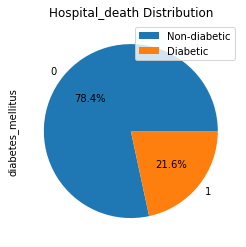

In [21]:
# Data visualization
train_df['diabetes_mellitus'].value_counts().plot(kind='pie',autopct='%1.1f%%', title="Hospital_death Distribution")
plt.legend(("Non-diabetic","Diabetic"))

In [22]:
#high skewness and kurtosis
print("Skewness: %f" % train_df['diabetes_mellitus'].skew())
print("Kurtosis: %f" % train_df['diabetes_mellitus'].kurt())

Skewness: 1.378241
Kurtosis: -0.100454


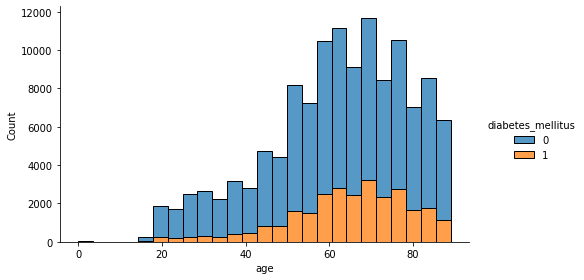

In [23]:
# Diabities VS Age:
#0: No diabetes
#1: Diabetes
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'age', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',
            bins=25,height = 4, aspect = 1.7)

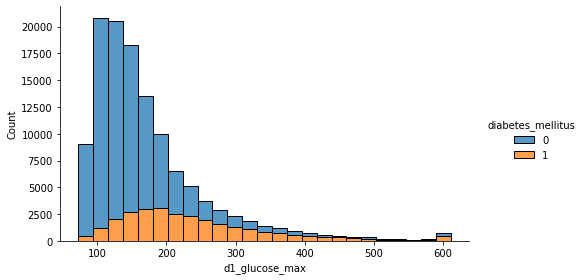

In [24]:
# Diabetes VS Glucose_max:
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'd1_glucose_max', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',
            bins=25,height = 4, aspect = 1.7)

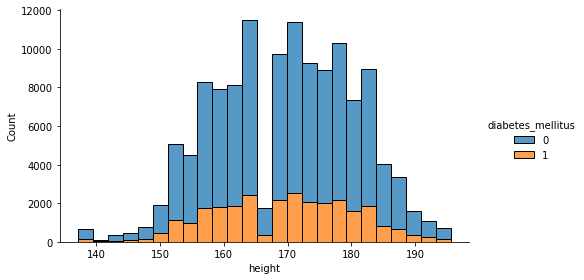

In [25]:
#Diabetes VS Height
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'height', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',
            bins=25,height = 4, aspect = 1.7)

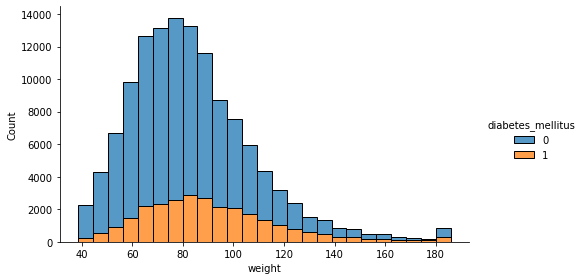

In [26]:
#Diabetes VS Weight
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'weight', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',
            bins=25,height = 4, aspect = 1.7)

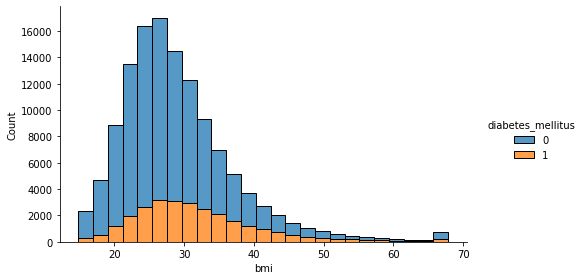

In [27]:
#Diabetes VS BMI
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'bmi', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',
            bins=25,height = 4, aspect = 1.7)

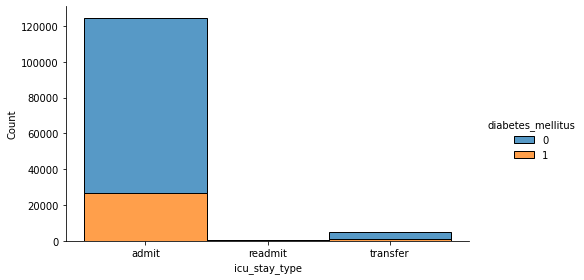

In [28]:
# Diabetes VS Icu_stay_type:
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'icu_stay_type', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',bins=25,height = 4, aspect = 1.7)

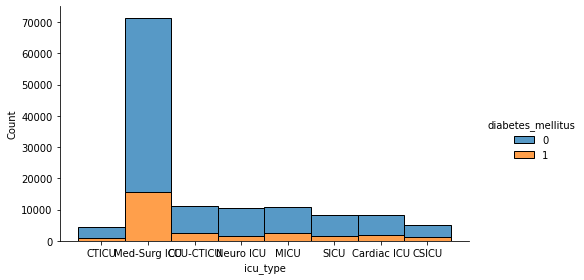

In [29]:
# Diabetes VS Icu_type:
sns.displot(data = train_df, 
            kind = 'hist', 
            x = 'icu_type', 
            hue = 'diabetes_mellitus', 
            multiple = 'stack',bins=25,height = 4, aspect = 1.7)

C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\seaborn\categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


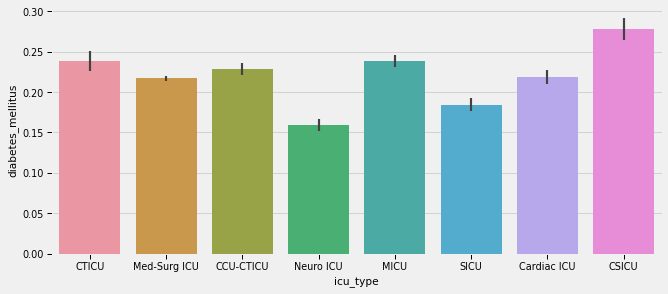

In [30]:
plt.style.use('fivethirtyeight')
sns.set_context("paper", font_scale=1.1)   
sns.factorplot(x="icu_type", 
               y="diabetes_mellitus", 
               data=train_df, kind="bar",height = 4, aspect = 2.3)

C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\seaborn\categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


<Figure size 216x288 with 0 Axes>

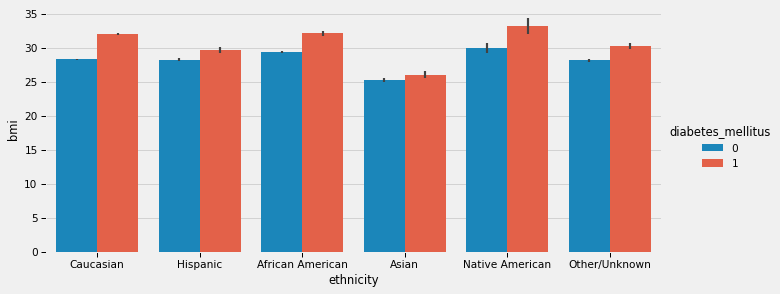

In [31]:
# Diabetes VS Ethnicity
plt.style.use('fivethirtyeight')
plt.figure(figsize=(3,4))
sns.set_context("paper", font_scale=1.2)   
sns.factorplot(x="ethnicity", 
               y="bmi", 
               hue="diabetes_mellitus", 
               data=train_df, 
               kind="bar",height = 4, aspect = 2.3)

In [32]:
# Find categorical features
categorical_feature_mask = train_df.dtypes==object
categorical_cols = train_df.columns[categorical_feature_mask].tolist()
print(categorical_cols)

['ethnicity', 'gender', 'icu_stay_type', 'icu_type']


C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\pmh1407\.conda\envs\tf-gpu\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn

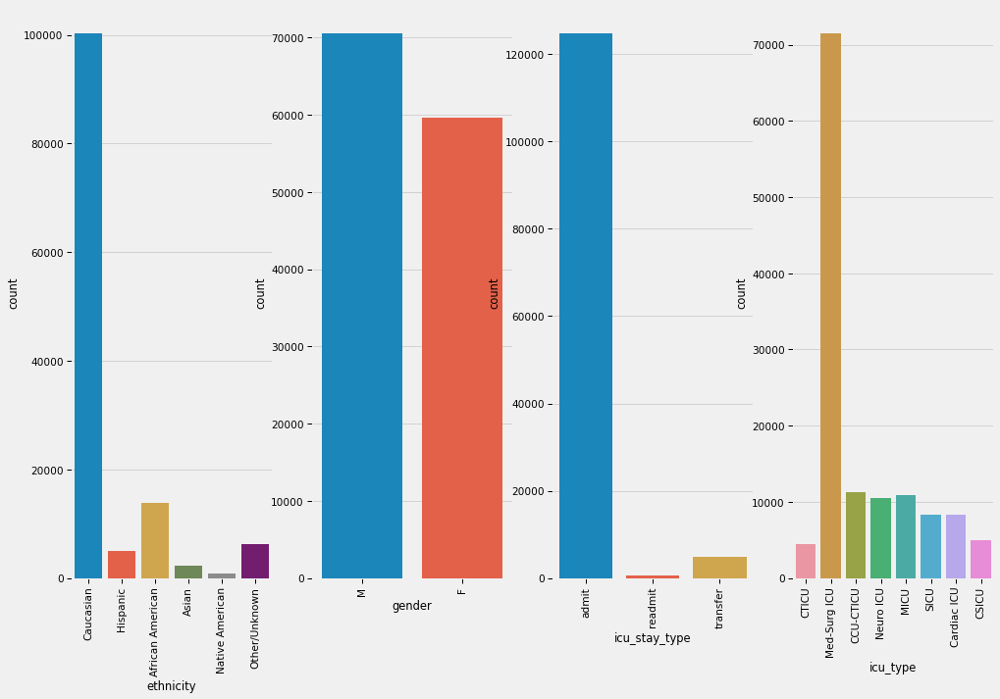

In [33]:
# Analyze categorical variables
fig, ax = plt.subplots(1, 4, figsize=(15, 10))
for variable, subplot in zip(categorical_cols, ax.flatten()):
    sns.countplot(train_df[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)

Text(0.5, 1.0, 'Correlation matrix')

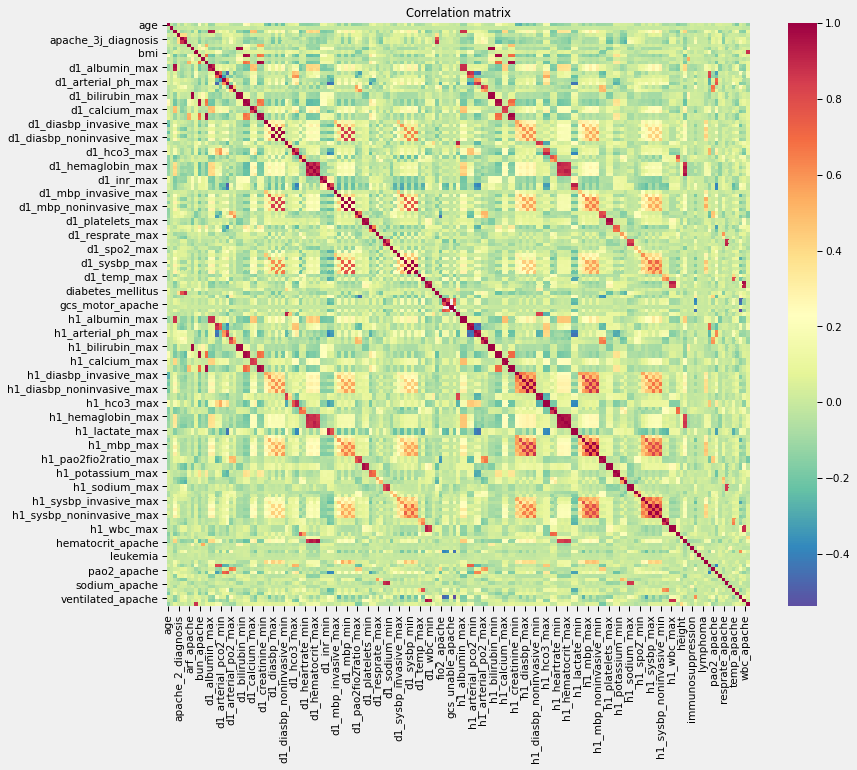

In [34]:
# diabetes_mellitus correlataion matrix for numerical (heatmap style)
df_num = train_df[train_df.columns.difference(categorical_cols)] # difference() won't drop anything but will sort alphabetically
corrmat = df_num.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corrmat, cmap='Spectral_r', square =True)
plt.title('Correlation matrix')

In [35]:
sort_corr = corrmat[['diabetes_mellitus']].unstack().abs().sort_values(kind='quicksort', ascending=False)
sort_corr

diabetes_mellitus  diabetes_mellitus                             1.00
                   d1_glucose_max                                0.40
                   glucose_apache                                0.35
                   h1_glucose_max                                0.32
                   h1_glucose_min                                0.30
                   bmi                                           0.17
                   weight                                        0.16
                   d1_bun_max                                    0.15
                   bun_apache                                    0.15
                   d1_bun_min                                    0.14
                   d1_glucose_min                                0.14
                   h1_bun_min                                    0.14
                   h1_bun_max                                    0.13
                   d1_creatinine_max                             0.13
                   d

Index(['diabetes_mellitus', 'd1_glucose_max', 'glucose_apache', 'h1_glucose_max', 'h1_glucose_min', 'bmi', 'weight', 'd1_bun_max', 'bun_apache', 'd1_bun_min', 'd1_glucose_min'], dtype='object')
[[ 1. nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan]]


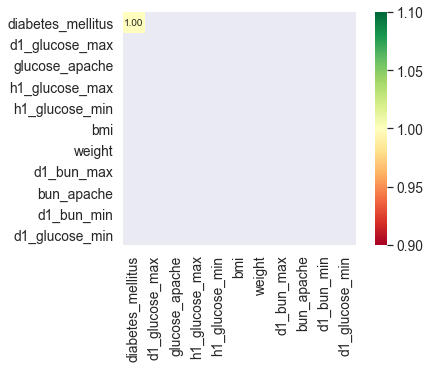

In [36]:
# diabetes_mellitus correlation matrix for top 10 numericals?
k = 11
cols = corrmat.abs().nlargest(k,'diabetes_mellitus')['diabetes_mellitus'].index
print(cols)
cm = np.corrcoef(train_df[cols].values.T)
print(cm)
sns.set(font_scale=1.25)
heatmap = sns.heatmap(cm, cbar=True, square = True, annot=True,fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values,cmap ='RdYlGn')
plt.show()  

# III. Handle missing data

- Age = 0 -> median (Why? only <4% in Age (train) is missing-> median is ok)
- Gender: NA -> M (Why? In gender col, Only 66 missing values in train, 5 missing values in test)
- Weight and Height (H/W): NA -> median of weight/ height grouped by Gender- based on train set
- BMI: Fill bmi with weight/(height/100)^2 in train+test set
- Ethnicity: NA -> 'Other/Unknown'(Why? The class: 'Other/Unknown' has been already in the set of classes for ethnicity)
- Missing data in numerical columns: Fill missing values BASED ON highly correlated columns + Drop columns with 95 or 99% correlated + Handle the rest numeric cols with median

<AxesSubplot:>

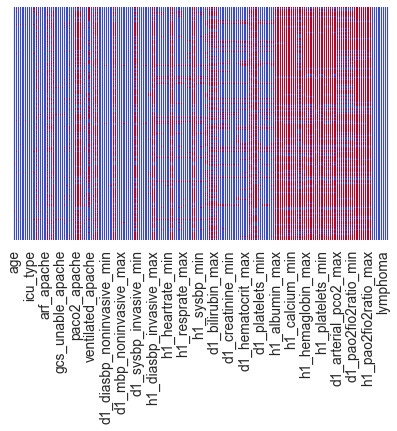

In [37]:
import missingno as msno
sns.heatmap(train_df.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

##1.Check and drop columns with >= 60% missing values

In [38]:
#Check the % of missing data in train set
train_df_missingdata = train_df.loc[:,train_df.isnull().mean()>.0]
train_df_missingdata.shape

(130157, 155)

In [39]:
#Trainning set, cols with >60% NULL values/missing data 
train_df1_missing60 = train_df.loc[:,train_df.isnull().mean()>.6]
train_df1_missing60.shape

(130157, 64)

In [40]:
#Check the % of missing data in test set
test_missingdata = test_df.loc[:,test_df.isnull().mean()>.0]
test_missingdata.shape

(10234, 154)

In [41]:
#Trainning set, cols with >60% NULL values/missing data 
test_missingdata60 = test_df.loc[:,test_df.isnull().mean()>.6]
test_missingdata60.shape

(10234, 61)

In [42]:
#Drop all cols missing more than 60%
na_60_cols=train_df.loc[:,train_df.isnull().mean()>.6]
train_df.drop(na_60_cols.columns,axis=1,inplace=True)
test_df.drop(na_60_cols.columns,axis=1,inplace=True)

In [43]:
# #Heatmap for new train set data
# sns.heatmap(train_df.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

## 2.Missing data in demographic cols (all categorical included)

In [44]:
# NA for demographic
#1--Age
train_df['age'].fillna(train_df['age'].median(),inplace=True)
test_df['age'].fillna(test_df['age'].median(),inplace=True)

In [45]:
#2--Gender
train_df['gender'].fillna('M',inplace=True)
test_df['gender'].fillna('M',inplace=True)

In [46]:
#3--Ethnicity
train_df['ethnicity'].fillna('Other/Unknown',inplace=True)
test_df['ethnicity'].fillna('Other/Unknown',inplace=True)

In [47]:
#4--Weight and height
def mean_hw(df):
    return df.filter(['gender', 'weight', 'height']).groupby('gender').mean()

def mean_hw_without_gender(df):
    return df.filter(['weight','height']).mean()

def fill_height_weight(df):
    df["height"] = np.where((df["height"].isna() & (df["gender"] == 'F')), 
                              mean_hw(df)['height'][0], df["height"])
    df["height"] = np.where((df["height"].isna() & (df["gender"] == 'M')), 
                              mean_hw(df)['height'][1], df["height"])
    
    df["weight"] = np.where((df["weight"].isna() & (df["gender"] == 'F')), 
                              mean_hw(df)['weight'][0], df["weight"])
    df["weight"] = np.where((df["weight"].isna() & (df["gender"] == 'M')), 
                              mean_hw(df)['weight'][1], df["weight"])
    
    
    df["weight"] = np.where((df["weight"].isna() & (df["gender"].isna())), 
                              mean_hw_without_gender(df)[0], df["weight"])
    df["height"] = np.where((df["height"].isna() & (df["gender"].isna())), 
                              mean_hw_without_gender(df)[1], df["height"])
    
fill_height_weight(train_df)
fill_height_weight(test_df)

In [48]:
#5--Fill bmi with weight/(height/100)^2 in train+test set
def fill_bmi(df):
    df['bmi'] = np.where(df['bmi'].isna(), df['weight']/ (df['height']/100)**2, df['bmi'])
fill_bmi(train_df)
fill_bmi(test_df)

In [49]:
# Find numerical features
numerical_feature_mask = train_df.dtypes!=object
numerical_cols = train_df.columns[numerical_feature_mask].tolist()
print(numerical_cols)

['age', 'bmi', 'elective_surgery', 'height', 'pre_icu_los_days', 'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'wbc_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min', 'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min', 'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min', 'h1_heartrate_max', 'h1_heartrate

##3.Check highly correlated features (>90%) and choose features to merge

In [50]:
# Highly correlated features (>90%)
highcor_columns=[]
corr = train_df[numerical_cols].corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >=0.9:
            if columns[j]:
                columns[j] = False
                print('FEAT_A: {} FEAT_B: {} - Correlation: {}'.format(train_df[numerical_cols].columns[i] , train_df[numerical_cols].columns[j], corr.iloc[i,j]))
        elif corr.iloc[i,j] <= -0.9:
            if columns[j]:
                columns[j] = False

highcor_columns = train_df[numerical_cols].columns[columns == False].values
print('highcor_columns',len(highcor_columns),highcor_columns)

FEAT_A: elective_surgery FEAT_B: apache_post_operative - Correlation: 0.9095727877072517
FEAT_A: bun_apache FEAT_B: d1_bun_max - Correlation: 0.9865538859491303
FEAT_A: bun_apache FEAT_B: d1_bun_min - Correlation: 0.9659601930385197
FEAT_A: creatinine_apache FEAT_B: d1_creatinine_max - Correlation: 0.9934021867937014
FEAT_A: creatinine_apache FEAT_B: d1_creatinine_min - Correlation: 0.9685947177719479
FEAT_A: glucose_apache FEAT_B: d1_glucose_max - Correlation: 0.9233223314008884
FEAT_A: hematocrit_apache FEAT_B: d1_hemaglobin_min - Correlation: 0.9450632903798881
FEAT_A: hematocrit_apache FEAT_B: d1_hematocrit_max - Correlation: 0.9080409232371148
FEAT_A: hematocrit_apache FEAT_B: d1_hematocrit_min - Correlation: 0.9670616121283165
FEAT_A: sodium_apache FEAT_B: d1_sodium_min - Correlation: 0.9188545369849891
FEAT_A: wbc_apache FEAT_B: d1_wbc_max - Correlation: 0.9684005389121155
FEAT_A: wbc_apache FEAT_B: d1_wbc_min - Correlation: 0.9248275838739576
FEAT_A: d1_diasbp_max FEAT_B: d1_di

In [51]:
# missing value before merged
merged_col = list(f"d1_{col}_min" for col in ['hematocrit','sodium']) + list([f"d1_{col}_max" for col in ['bun', 'creatinine', 'glucose', 'wbc']])
print("Train data:\n{}".format(train_df[merged_col].isna().sum()))
print("\nTest data:\n{}".format(test_df[merged_col].isna().sum()))

Train data:
d1_hematocrit_min    15588
d1_sodium_min        13270
d1_bun_max           13734
d1_creatinine_max    13273
d1_glucose_max        8243
d1_wbc_max           17429
dtype: int64

Test data:
d1_hematocrit_min    1229
d1_sodium_min        1066
d1_bun_max           1108
d1_creatinine_max    1091
d1_glucose_max        681
d1_wbc_max           1422
dtype: int64


In [52]:
# Fill missing values BASED ON highly correlated columns and drop replaced _apache
def merge_value(df):
    for col in ['hematocrit','sodium']:
        df[f"d1_{col}_min"] = np.where(df[f"{col}_apache"].notna() & df[f"d1_{col}_min"].isna(), df[f"{col}_apache"], df[f"d1_{col}_min"])
    for col in ['bun', 'creatinine', 'glucose', 'wbc']:
        df[f"d1_{col}_max"] = np.where(df[f"{col}_apache"].notna() & df[f"d1_{col}_max"].isna(), df[f"{col}_apache"], df[f"d1_{col}_max"])
    
    df.drop(f"{col}_apache", axis =1, inplace = True)
    
merge_value(train_df)
merge_value(test_df)

In [53]:
# missing data after merged
print("Train data:\n{}".format(train_df[merged_col].isna().sum()))
print("\nTest data:\n{}".format(test_df[merged_col].isna().sum()))

Train data:
d1_hematocrit_min    14410
d1_sodium_min        12303
d1_bun_max           12752
d1_creatinine_max    12285
d1_glucose_max        7652
d1_wbc_max           16134
dtype: int64

Test data:
d1_hematocrit_min    1158
d1_sodium_min        1001
d1_bun_max           1038
d1_creatinine_max    1022
d1_glucose_max        642
d1_wbc_max           1346
dtype: int64


##4.Fill missing PaO2FiO2ratio min = PaO2/FiO2

In [54]:
# Fill missing PaO2FiO2ratio min = PaO2/FiO2
def fill_pao2fio2ratio(df):
    df['d1_pao2fio2ratio_min'] = np.where(df['pao2_apache'].notna() & df['fio2_apache'].notna() & df['d1_pao2fio2ratio_min'].isna(), df['pao2_apache']/df['fio2_apache'], df['d1_pao2fio2ratio_min'])
fill_bmi(train_df)
fill_bmi(test_df)

In [55]:
# Find new numerical features
numerical_feature_mask1 = train_df.dtypes!=object
numerical_cols1 = train_df.columns[numerical_feature_mask1].tolist()
print(numerical_cols1)

['age', 'bmi', 'elective_surgery', 'height', 'pre_icu_los_days', 'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min', 'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min', 'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min', 'h1_heartrate_max', 'h1_heartrate_min', 'h1_mbp

##5.Drop highly correlated features (>99%)

In [56]:
# Drop highly correlated features (>95%)
drop_columns=[]
corr = train_df[numerical_cols1].corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >=0.95:
            if columns[j]:
                columns[j] = False
                print('FEAT_A: {} FEAT_B: {} - Correlation: {}'.format(train_df[numerical_cols1].columns[i] , train_df[numerical_cols1].columns[j], corr.iloc[i,j]))
        elif corr.iloc[i,j] <= -0.95:
            if columns[j]:
                columns[j] = False

drop_columns = train_df[numerical_cols1].columns[columns == False].values
print('drop_columns',len(drop_columns),drop_columns)

FEAT_A: bun_apache FEAT_B: d1_bun_max - Correlation: 0.9866363755516794
FEAT_A: bun_apache FEAT_B: d1_bun_min - Correlation: 0.9659601930385197
FEAT_A: creatinine_apache FEAT_B: d1_creatinine_max - Correlation: 0.9934529844165646
FEAT_A: creatinine_apache FEAT_B: d1_creatinine_min - Correlation: 0.9685947177719479
FEAT_A: hematocrit_apache FEAT_B: d1_hematocrit_min - Correlation: 0.967377066582142
FEAT_A: d1_diasbp_max FEAT_B: d1_diasbp_noninvasive_max - Correlation: 0.9966816614735392
FEAT_A: d1_diasbp_min FEAT_B: d1_diasbp_noninvasive_min - Correlation: 0.9965988636059405
FEAT_A: d1_mbp_max FEAT_B: d1_mbp_noninvasive_max - Correlation: 0.9847093054886691
FEAT_A: d1_mbp_min FEAT_B: d1_mbp_noninvasive_min - Correlation: 0.9953613164729417
FEAT_A: d1_sysbp_max FEAT_B: d1_sysbp_noninvasive_max - Correlation: 0.9964039222025166
FEAT_A: d1_sysbp_min FEAT_B: d1_sysbp_noninvasive_min - Correlation: 0.9956663375410396
FEAT_A: h1_diasbp_max FEAT_B: h1_diasbp_noninvasive_max - Correlation: 0.98

In [57]:
# Drop highly correlated features after fill NA
train_df.drop(drop_columns, axis=1, inplace = True)
test_df.drop(drop_columns, axis=1, inplace = True)

##6.Fill the rest of numerical cols with median

In [58]:
# Find new numerical features again
numerical_feature_mask2 = train_df.dtypes!=object
numerical_cols2 = train_df.columns[numerical_feature_mask2].tolist()
print(numerical_cols2)

['age', 'bmi', 'elective_surgery', 'height', 'pre_icu_los_days', 'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min', 'h1_heartrate_max', 'h1_heartrate_min', 'h1_mbp_max', 'h1_mbp_min', 'h1_resprate_max', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min', 'h1_sysbp_max', 'h1_sysbp_min', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max', 'd1_albumin_min', 'd1_bilirubin_max', 'd1_calcium_max',

In [59]:
# Fill the rest of numerical cols with median in train set
train_df[numerical_cols2] = train_df[numerical_cols2].apply(lambda col: col.fillna(col.median()))
# another way is to use Simple Imputer, but this will not preserve data types
train_df[numerical_cols2].head()

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_calcium_max,d1_calcium_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_platelets_max,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
0,68.00,22.73,0,180.30,0.54,73.90,113.00,502.01,0,0,31.00,2.51,3.00,6.00,0.00,4.00,168.00,118.00,27.40,0,40.00,36.00,134.00,39.30,"1,454.98",0,68.00,37.00,119.00,72.00,89.00,46.00,34.00,10.00,100.00,74.00,131.00,73.00,39.90,37.20,68.00,63.00,119.00,108.00,86.00,85.00,26.00,18.00,100.00,74.00,131.00,115.00,39.50,37.50,2.30,2.30,0.40,8.50,7.40,168.00,109.00,19.00,15.00,8.90,8.90,233.00,4.00,3.40,136.00,134.00,14.10,14.10,140.00,0,0,0,0,0,0,0,1
1,77.00,27.42,0,160.00,0.93,70.20,108.00,203.01,0,0,9.00,0.56,1.00,3.00,0.00,1.00,145.00,120.00,36.90,0,46.00,33.00,145.00,35.10,"1,454.98",1,95.00,31.00,118.00,72.00,120.00,38.00,32.00,12.00,100.00,70.00,159.00,67.00,36.30,35.10,61.00,48.00,114.00,100.00,85.00,57.00,31.00,28.00,95.00,70.00,95.00,71.00,36.30,36.30,1.60,1.60,0.50,8.60,8.00,145.00,128.00,27.00,26.00,11.30,11.10,557.00,4.20,3.80,145.00,145.00,23.30,12.70,145.00,0,0,0,0,0,0,0,1
2,25.00,31.95,0,172.70,0.00,95.30,122.00,703.03,0,0,19.00,0.97,3.00,6.00,0.00,5.00,133.00,102.00,33.10,0,68.00,37.00,138.00,36.70,"1,454.98",0,88.00,48.00,96.00,68.00,102.00,68.00,21.00,8.00,98.00,91.00,148.00,105.00,37.00,36.70,88.00,58.00,96.00,78.00,91.00,83.00,20.00,16.00,98.00,91.00,148.00,124.00,36.70,36.70,3.00,2.90,0.70,8.40,8.20,149.00,108.00,24.00,23.00,11.40,10.90,194.00,4.20,3.90,139.00,138.00,11.06,10.10,140.00,0,0,0,0,0,0,0,0
3,81.00,22.64,1,165.10,0.00,61.70,203.00,"1,206.03",1,0,19.00,0.97,4.00,6.00,0.00,5.00,185.00,114.00,25.90,1,60.00,4.00,138.00,34.80,"1,454.98",1,48.00,42.00,116.00,92.00,84.00,84.00,23.00,7.00,100.00,95.00,158.00,84.00,38.00,34.80,62.00,44.00,100.00,96.00,92.00,71.00,12.00,11.00,100.00,99.00,136.00,106.00,35.60,34.80,3.00,2.90,0.70,8.40,8.20,185.00,88.00,24.00,23.00,11.60,8.90,198.00,5.00,3.50,139.00,138.00,9.00,8.00,140.00,0,0,0,0,0,0,0,0
4,19.00,25.32,0,188.00,0.07,89.48,119.00,601.01,0,0,19.00,0.97,4.00,6.00,0.00,5.00,133.00,60.00,33.10,0,103.00,16.00,138.00,36.70,"1,454.98",0,99.00,57.00,89.00,60.00,104.00,90.00,18.00,16.00,100.00,96.00,147.00,120.00,37.20,36.70,99.00,68.00,89.00,76.00,104.00,92.00,21.00,16.00,100.00,100.00,130.00,120.00,36.70,36.70,3.00,2.90,0.70,8.40,8.20,149.00,108.00,24.00,23.00,11.40,10.90,194.00,4.20,3.90,139.00,138.00,11.06,10.10,140.00,0,0,0,0,0,0,0,0


In [60]:
# Fill the rest of numerical cols with median in test set
numerical_feature_mask_test = test_df.dtypes!=object
numerical_cols_test = test_df.columns[numerical_feature_mask_test].tolist()
print(numerical_cols_test)
test_df[numerical_cols_test] = test_df[numerical_cols_test].apply(lambda col: col.fillna(col.median()))
# # another way is to use Simple Imputer, but this will not preserve data types
test_df[numerical_cols_test].head()

['age', 'bmi', 'elective_surgery', 'height', 'pre_icu_los_days', 'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min', 'h1_heartrate_max', 'h1_heartrate_min', 'h1_mbp_max', 'h1_mbp_min', 'h1_resprate_max', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min', 'h1_sysbp_max', 'h1_sysbp_min', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max', 'd1_albumin_min', 'd1_bilirubin_max', 'd1_calcium_max',

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_calcium_max,d1_calcium_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_platelets_max,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
0,72,33.20,0,152.40,0.02,77.11,110.00,104.01,0,0,44.00,1.49,4.00,6.00,0.00,5.00,97.00,38.00,39.90,0,54.00,31.00,130.00,36.40,"1,569.50",0,104.00,40.00,66.00,38.00,123.00,54.00,35.00,15.00,100.00,96.00,149.00,76.00,38.70,35.60,59.00,59.00,46.00,44.00,80.00,80.00,19.00,19.00,97.00,96.00,116.00,116.00,36.40,36.40,2.80,2.80,1.90,9.80,9.30,104.00,97.00,26.00,23.00,14.50,14.20,173.00,5.70,4.90,132.00,130.00,5.60,5.40,104.00,0,0,0,0,0,0,0
1,86,25.09,0,175.30,0.00,77.11,117.00,106.01,0,0,19.00,0.92,4.00,6.00,0.00,5.00,73.00,116.00,33.00,0,41.00,53.00,142.00,36.30,"1,569.50",0,101.00,27.00,116.00,56.00,129.00,41.00,51.00,14.00,100.00,95.00,181.00,65.00,36.80,36.40,85.00,65.00,116.00,104.00,129.00,94.00,31.00,24.00,97.00,95.00,181.00,119.00,36.70,36.70,3.00,2.90,0.70,8.50,8.50,102.00,73.00,27.00,27.00,11.50,10.90,193.00,3.90,3.80,144.00,144.00,11.10,10.00,143.00,0,0,0,0,0,0,0
2,72,29.17,0,162.60,0.00,77.11,302.00,109.01,0,0,24.00,0.77,4.00,6.00,0.00,5.00,84.00,104.00,34.80,0,117.00,38.00,137.00,36.40,"1,569.50",0,97.00,61.00,98.00,68.00,117.00,77.00,49.00,8.00,99.00,85.00,146.00,103.00,36.90,35.90,97.00,97.00,98.00,92.00,117.00,117.00,20.00,20.00,99.00,96.00,146.00,146.00,36.40,36.40,3.70,3.20,0.90,9.10,8.50,141.00,84.00,32.00,31.00,11.80,11.50,253.00,3.60,3.60,141.00,137.00,6.60,4.60,84.00,0,0,0,0,0,0,0
3,66,28.10,0,177.80,0.88,88.85,113.00,501.05,0,0,18.00,0.94,4.00,6.00,0.00,4.00,139.00,110.00,33.00,0,61.00,56.00,138.00,36.60,"1,569.50",1,77.00,51.00,110.00,86.00,110.00,61.00,56.00,19.00,99.00,80.00,145.00,95.00,37.80,36.60,72.00,61.00,107.00,95.00,88.00,77.00,56.00,28.00,95.00,90.00,130.00,114.00,37.80,37.00,2.00,2.00,1.10,9.00,9.00,84.00,84.00,24.00,24.00,10.80,10.80,303.00,4.10,4.10,136.00,136.00,24.80,24.80,143.00,0,0,0,0,0,0,0
4,89,30.67,0,170.20,0.01,88.85,117.00,106.01,0,0,26.00,1.50,4.00,6.00,0.00,5.00,99.00,34.00,33.00,0,136.00,35.00,133.00,36.50,"1,569.50",0,88.00,49.00,58.00,34.00,136.00,71.00,49.00,9.00,100.00,93.00,194.00,114.00,36.70,35.80,70.00,66.00,48.00,44.00,102.00,89.00,26.00,20.00,97.00,94.00,145.00,142.00,36.60,36.60,3.40,3.40,0.40,8.80,8.60,159.00,99.00,33.00,30.00,10.80,10.70,157.00,4.00,3.90,136.00,133.00,6.20,5.20,149.00,0,0,0,0,0,0,0


In [61]:
train_df[numerical_cols2].isna().sum()

age                            0
bmi                            0
elective_surgery               0
height                         0
pre_icu_los_days               0
weight                         0
apache_2_diagnosis             0
apache_3j_diagnosis            0
apache_post_operative          0
arf_apache                     0
bun_apache                     0
creatinine_apache              0
gcs_eyes_apache                0
gcs_motor_apache               0
gcs_unable_apache              0
gcs_verbal_apache              0
glucose_apache                 0
heart_rate_apache              0
hematocrit_apache              0
intubated_apache               0
map_apache                     0
resprate_apache                0
sodium_apache                  0
temp_apache                    0
urineoutput_apache             0
ventilated_apache              0
d1_diasbp_max                  0
d1_diasbp_min                  0
d1_heartrate_max               0
d1_heartrate_min               0
d1_mbp_max

In [62]:
test_df[numerical_cols_test].isna().sum()

age                            0
bmi                            0
elective_surgery               0
height                         0
pre_icu_los_days               0
weight                         0
apache_2_diagnosis             0
apache_3j_diagnosis            0
apache_post_operative          0
arf_apache                     0
bun_apache                     0
creatinine_apache              0
gcs_eyes_apache                0
gcs_motor_apache               0
gcs_unable_apache              0
gcs_verbal_apache              0
glucose_apache                 0
heart_rate_apache              0
hematocrit_apache              0
intubated_apache               0
map_apache                     0
resprate_apache                0
sodium_apache                  0
temp_apache                    0
urineoutput_apache             0
ventilated_apache              0
d1_diasbp_max                  0
d1_diasbp_min                  0
d1_heartrate_max               0
d1_heartrate_min               0
d1_mbp_max

#IV. Feature Generating

##1.Generate group age and BMI

- Generate group age and BMI based on CDC info
- Generate comorbidity score as weights for comorbidity values

In [63]:
# Generate group Age
def categorize_age(x):
    if x < 44: 
        return "Group1:<44"
    elif x >= 45 and x < 65:
        return "Group2:45-65"
    elif x >= 65:
        return "Group3:>=65"

In [64]:
# Generate group BMI
def categorize_bmi(x):
    if x < 18.5:
        return "Underweight"
    elif 18.5 <= x and x < 25:
        return "Normal"
    elif 25 <= x and x < 30:
        return "Overweight"
    elif x > 30:
        return "Obesity"

In [65]:
train_df.insert(2, 'cat_bmi', train_df['bmi'].apply(lambda x: categorize_bmi(x)))
test_df.insert(2, 'cat_bmi', test_df['bmi'].apply(lambda x: categorize_bmi(x)))

In [66]:
train_df.insert(1, 'cat_age', train_df['age'].apply(lambda x: categorize_age(x)))   
test_df.insert(1, 'cat_age', test_df['age'].apply(lambda x: categorize_age(x))) 

##2.Visualize cat_bmi and cat_age vs target feature

In [67]:
import plotly as pl
import plotly.express as px 
import plotly.graph_objects as go
import plotly.figure_factory as ff
# visualize cat_bmi vs target feature
fig = px.histogram(train_df, x='cat_bmi', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='BMI group vs diabetes')
fig.show()

In [68]:
# visualize cat_age vs target feature
fig = px.histogram(train_df, x='cat_age', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='Age group vs diabetes')
fig.show()

##3.Generate diabetes_comorbidity_score

In [69]:
# The weights to create comorbidity score is unstable because it's only based on the current database
comorbidity_var = ['aids','cirrhosis','hepatic_failure','immunosuppression','leukemia','lymphoma','solid_tumor_with_metastasis']
weight_list = []
for col in comorbidity_var:
    weights = ((((train_df['diabetes_mellitus'] == 1) & (train_df[col] == 1))).sum()/(train_df[col] == 1).sum())
    weights = round(100*weights)
    weight_list.append(weights)
dfcs = pd.DataFrame(np.column_stack([comorbidity_var,weight_list]), 
                               columns=['Comorbidities', 'Weights'])
dfcs

,Comorbidities,Weights
0,aids,8.0
1,cirrhosis,27.0
2,hepatic_failure,25.0
3,immunosuppression,21.0
4,leukemia,23.0
5,lymphoma,21.0
6,solid_tumor_with_metastasis,18.0


In [70]:
# dfcs[dfcs['Comorbidities']=='aids']['Weights']

In [71]:
train_df.loc[:,'comorbidity_score'] = 0
train_df['comorbidity_score']= train_df['aids'].values*8+train_df['cirrhosis'].values*27+train_df['hepatic_failure'].values*25+train_df['immunosuppression'].values*21+train_df['leukemia'].values*23+train_df['lymphoma'].values*21+train_df['solid_tumor_with_metastasis'].values*18

In [72]:
test_df.loc[:,'comorbidity_score'] = 0
test_df['comorbidity_score']= test_df['aids'].values*8+test_df['cirrhosis'].values*27+test_df['hepatic_failure'].values*25+test_df['immunosuppression'].values*21+test_df['leukemia'].values*23+test_df['lymphoma'].values*21+test_df['solid_tumor_with_metastasis'].values*18

In [73]:
train_df[train_df['comorbidity_score'] > 30]

,age,cat_age,bmi,cat_bmi,elective_surgery,ethnicity,gender,height,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_calcium_max,d1_calcium_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_platelets_max,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus,comorbidity_score
35,71.00,Group3:>=65,38.50,Obesity,0,Caucasian,M,177.80,admit,Neuro ICU,0.00,121.70,301.00,410.01,0,0,16.00,1.10,2.00,5.00,0.00,2.00,198.00,94.00,33.10,0,137.00,4.00,142.00,37.00,"1,454.98",1,105.00,51.00,96.00,70.00,137.00,76.00,59.00,4.00,100.00,95.00,204.00,114.00,38.20,36.70,78.00,74.00,88.00,82.00,93.00,93.00,30.00,28.00,97.00,97.00,163.00,136.00,36.70,36.70,3.00,2.90,0.70,8.40,8.40,198.00,158.00,23.00,23.00,12.70,12.70,235.00,3.70,3.70,142.00,142.00,13.30,13.30,195.00,0,1,1,0,0,0,0,1,52
46,64.00,Group2:45-65,16.98,Underweight,0,Caucasian,M,180.30,admit,Neuro ICU,2.82,55.20,217.00,"1,502.02",1,0,18.00,0.77,1.00,3.00,0.00,1.00,96.00,112.00,22.30,0,58.00,12.00,137.00,39.00,"1,454.98",1,58.00,26.00,122.00,0.00,86.00,46.00,23.00,0.00,100.00,41.00,170.00,41.00,39.20,37.20,54.00,44.00,84.00,84.00,82.00,80.00,16.00,16.00,100.00,100.00,160.00,130.00,37.40,37.20,3.00,2.90,0.70,8.50,8.00,113.00,96.00,23.00,22.00,7.60,7.00,96.00,4.30,4.30,145.00,137.00,24.60,21.80,140.00,0,0,0,1,0,0,1,0,39
49,67.00,Group3:>=65,28.69,Overweight,0,Caucasian,M,177.80,admit,Med-Surg ICU,0.01,90.70,102.00,206.01,0,0,8.00,0.96,3.00,5.00,0.00,4.00,147.00,110.00,30.80,0,64.00,54.00,138.00,36.20,"1,454.98",1,101.00,58.00,110.00,62.00,114.00,64.00,54.00,14.00,100.00,76.00,143.00,75.00,36.60,36.20,85.00,64.00,84.00,72.00,79.00,73.00,29.00,19.00,95.00,81.00,129.00,104.00,36.30,36.30,2.30,2.30,0.50,7.80,7.80,264.00,137.00,35.00,35.00,10.90,10.90,253.00,3.90,3.90,138.00,138.00,6.60,6.60,140.00,0,1,1,0,0,0,0,1,52
66,70.00,Group3:>=65,25.98,Overweight,0,Caucasian,M,172.70,admit,MICU,1.77,77.50,122.00,703.03,0,0,14.00,0.94,1.00,1.00,0.00,1.00,116.00,101.00,32.00,0,58.00,49.00,137.00,36.40,"1,454.98",1,82.00,48.00,99.00,58.00,97.00,61.00,25.00,6.00,100.00,80.00,161.00,83.00,37.70,36.40,66.00,56.00,91.00,78.00,78.00,65.00,23.00,9.00,100.00,80.00,108.00,85.00,37.10,37.10,2.90,2.90,0.20,8.70,8.70,145.00,116.00,32.00,30.00,12.60,10.80,162.00,4.60,4.00,137.00,137.00,10.20,5.70,145.00,0,0,0,1,0,0,1,0,39
113,48.00,Group2:45-65,25.97,Overweight,0,Caucasian,M,175.30,admit,Med-Surg ICU,0.01,79.80,120.00,407.01,0,0,37.00,1.03,4.00,6.00,0.00,5.00,159.00,140.00,19.90,0,57.00,32.00,143.00,36.60,"1,454.98",0,84.00,54.00,140.00,76.00,97.00,57.00,28.00,8.00,100.00,89.00,128.00,80.00,37.20,36.60,63.00,55.00,140.00,128.00,76.00,69.00,28.00,18.00,100.00,99.00,128.00,101.00,36.90,36.60,2.00,2.00,1.80,7.50,7.50,159.00,159.00,27.00,23.00,8.60,6.60,142.00,5.00,4.10,145.00,143.00,7.90,5.40,140.00,0,1,1,0,0,0,0,0,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [74]:
test_df[test_df['comorbidity_score'] > 30]

,age,cat_age,bmi,cat_bmi,elective_surgery,ethnicity,gender,height,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_calcium_max,d1_calcium_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_platelets_max,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,comorbidity_score
97,37,Group1:<44,29.17,Overweight,0,Caucasian,F,162.60,admit,Med-Surg ICU,2.66,77.11,113.00,501.05,0,0,5.00,0.59,4.00,6.00,0.00,5.00,114.00,129.00,28.20,0,62.00,28.00,138.00,36.90,"1,569.50",0,97.00,49.00,125.00,81.00,111.00,62.00,28.00,20.00,100.00,84.00,136.00,82.00,37.60,36.90,64.00,53.00,101.00,83.00,65.00,62.00,21.00,16.00,98.00,91.00,104.00,82.00,36.70,36.65,3.00,2.90,0.70,7.70,7.70,114.00,114.00,27.00,27.00,8.50,8.50,305.00,3.90,3.90,139.00,139.00,6.00,6.00,143.00,0,0,0,1,0,0,1,39
142,50,Group2:45-65,29.79,Overweight,0,Caucasian,M,172.70,admit,Med-Surg ICU,9.43,88.85,113.00,501.06,0,0,30.00,1.90,3.00,6.00,0.00,4.00,80.00,164.00,28.00,0,54.00,43.00,136.00,36.70,"1,569.50",0,72.00,45.00,160.00,93.00,86.00,54.00,49.00,16.00,100.00,92.00,131.00,68.00,39.87,36.70,53.00,45.00,133.00,124.00,70.00,64.00,34.00,24.00,96.00,96.00,94.00,89.00,39.40,36.80,1.60,1.60,5.10,8.50,8.00,93.00,80.00,19.00,16.00,9.60,7.40,27.00,3.50,2.50,139.00,136.00,0.81,0.60,143.00,0,0,0,1,0,1,0,42
257,56,Group2:45-65,27.33,Overweight,0,Caucasian,M,180.30,admit,Med-Surg ICU,1.94,88.85,106.00,212.01,0,0,18.00,0.94,4.00,6.00,0.00,5.00,119.00,99.00,33.00,1,109.00,26.00,138.00,36.80,"1,569.50",1,85.00,53.00,102.00,70.00,109.00,77.00,18.00,16.00,100.00,82.00,146.00,104.00,37.70,36.80,85.00,59.00,99.00,84.00,109.00,78.00,21.00,16.00,100.00,91.00,146.00,104.00,36.70,36.65,3.00,2.90,0.70,6.70,6.70,148.00,119.00,27.00,27.00,11.80,10.80,217.00,4.10,4.10,130.00,130.00,7.20,5.80,144.00,0,0,0,1,1,0,0,44
291,91,Group3:>=65,29.79,Overweight,0,Caucasian,M,172.70,admit,Med-Surg ICU,0.00,88.85,118.00,602.17,0,0,23.00,1.00,4.00,6.00,0.00,5.00,91.00,49.00,27.90,0,141.00,55.00,138.00,36.90,"1,569.50",0,110.00,58.00,71.00,49.00,141.00,84.00,51.00,12.00,100.00,82.00,183.00,123.00,37.30,36.60,79.00,58.00,58.00,54.00,105.00,84.00,29.00,12.00,100.00,98.00,143.00,123.00,37.10,37.10,2.80,2.80,1.50,7.70,7.70,91.00,91.00,28.00,28.00,10.10,9.00,193.00,4.00,4.00,138.00,138.00,11.10,10.00,143.00,0,0,0,1,0,0,1,39
329,56,Group2:45-65,27.45,Overweight,0,Caucasian,F,167.60,admit,MICU,0.01,77.11,304.00,301.03,0,0,15.00,2.00,4.00,6.00,0.00,4.00,101.00,58.00,19.90,0,132.00,14.00,138.00,34.10,"1,569.50",0,79.00,28.00,90.00,60.00,117.00,33.00,22.00,14.00,100.00,95.00,149.00,42.00,36.70,34.10,56.00,56.00,68.00,66.00,132.00,70.00,20.00,20.00,100.00,99.00,104.00,104.00,36.50,36.50,3.00,3.00,5.30,8.20,8.20,126.00,80.00,15.00,13.00,8.90,6.70,139.00,3.80,3.40,138.00,138.00,8.80,7.00,80.00,0,1,1,0,0,0,0,52
333,53,Group2:45-65,33.20,Obesity,0,Caucasian,F,152.40,admit,CTICU,0.00,77.11,304.00,301.02,0,0,49.00,1.71,1.00,4.00,0.00,1.00,107.00,54.00,29.70,0,65.00,40.00,139.00,36.20,"1,569.50",0,70.00,52.00,70.00,54.00,101.00,65.00,37.00,11.00,100.00,94.00,147.00,109.00,36.90,36.20,70.00,68.00,60.00,54.00,96.00,94.00

In [75]:
# Find new categorical features after generate cat_age and cat_bmi
categorical_feature_mask2 = train_df.dtypes==object
categorical_cols_new = train_df.columns[categorical_feature_mask2].tolist()
print(categorical_cols_new)
from sklearn.preprocessing import LabelEncoder # if data is nominal, use LE, if data is ordinal, use OE
train_df[categorical_cols_new] = train_df[categorical_cols_new].apply(lambda x: x.fillna(x.value_counts().index[0]))
le = LabelEncoder()
train_df[categorical_cols_new] = train_df[categorical_cols_new].astype(str).apply(lambda col: le.fit_transform(col)) 
train_df[categorical_cols_new].head()

['cat_age', 'cat_bmi', 'ethnicity', 'gender', 'icu_stay_type', 'icu_type']


,cat_age,cat_bmi,ethnicity,gender,icu_stay_type,icu_type
0,2,0,2,1,0,2
1,2,2,2,0,0,5
2,0,1,2,0,0,5
3,2,0,2,0,0,2
4,0,2,2,1,0,5


In [76]:
categorical_feature_mask_test = test_df.dtypes==object
categorical_cols_test = test_df.columns[categorical_feature_mask_test].tolist()
print(categorical_cols_test)
test_df[categorical_cols_test] = test_df[categorical_cols_test].apply(lambda x: x.fillna(x.value_counts().index[0]))
le = LabelEncoder()
test_df[categorical_cols_test] = test_df[categorical_cols_test].astype(str).apply(lambda col: le.fit_transform(col)) 
test_df[categorical_cols_test].head()

['cat_age', 'cat_bmi', 'ethnicity', 'gender', 'icu_stay_type', 'icu_type']


,cat_age,cat_bmi,ethnicity,gender,icu_stay_type,icu_type
0,2,1,2,0,0,5
1,2,2,2,0,0,5
2,2,2,2,0,0,5
3,2,2,2,1,0,5
4,2,1,2,1,0,5


In [77]:
test_df[categorical_cols_test].isnull().sum()
train_df[categorical_cols].isnull().sum()

ethnicity        0
gender           0
icu_stay_type    0
icu_type         0
dtype: int64

#V. Modelling

##1.Train-Test split

In [78]:
y = train_df['diabetes_mellitus'].values
X = train_df.drop(['diabetes_mellitus'],axis = 1).values
print(X)

[[68.          2.         22.73280282 ...  0.          0.
   0.        ]
 [77.          2.         27.421875   ...  0.          0.
   0.        ]
 [25.          0.         31.95274882 ...  0.          0.
   0.        ]
 ...
 [73.          2.         32.26537065 ...  0.          0.
   0.        ]
 [81.          2.         24.40857925 ...  0.          0.
   0.        ]
 [35.          0.         30.13235818 ...  0.          0.
   0.        ]]


In [79]:
# from sklearn.preprocessing import StandardScaler
# feature_scaler = StandardScaler()
# X_train = feature_scaler.fit_transform(X_train.astype(float))
# X_val = feature_scaler.transform(X_val.astype(float))
# print(X_train)
X_test = test_df.values
# X_test = feature_scaler.fit_transform(X_test.astype(float))
print(X_test)

[[72.          2.         33.20137352 ...  0.          0.
   0.        ]
 [86.          2.         25.09355271 ...  0.          0.
   0.        ]
 [72.          2.         29.16653932 ...  0.          0.
   0.        ]
 ...
 [74.          2.         22.7        ...  0.          0.
   0.        ]
 [90.          2.         19.9        ...  0.          0.
   0.        ]
 [30.          0.         25.6        ...  0.          0.
   0.        ]]


In [80]:
# from sklearn.ensemble import ExtraTreesClassifier
# from sklearn.feature_selection import SelectFromModel
# clf_f = ExtraTreesClassifier(n_estimators=50)
# clf_f = clf_f.fit(X, y)
# model = SelectFromModel(clf_f, prefit=True)
# X_new = model.transform(X)
# X_test_new = model.transform(test_df)

In [81]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_val.shape,  y_val.shape)

Train set: (91109, 87) (91109,)
Test set: (39048, 87) (39048,)


In [82]:
from imblearn.over_sampling import SMOTE
print("Before OverSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train==0)))
oversample = SMOTE(sampling_strategy=0.35,random_state=42)
X_train_res, y_train_res = oversample.fit_resample(X_train, y_train.ravel())
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

Before OverSampling, counts of label '1': 19706
Before OverSampling, counts of label '0': 71403 

After OverSampling, the shape of train_X: (96394, 87)
After OverSampling, the shape of train_y: (96394,) 

After OverSampling, counts of label '1': 24991
After OverSampling, counts of label '0': 71403


In [83]:
# X_train_res.shape[1]

In [84]:
#Import library and functions
# from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn import metrics
import lightgbm as lgbm
import lightgbm as LGBMClassifier
from sklearn.metrics import accuracy_score, roc_auc_score as ras
from sklearn.metrics import plot_roc_curve
import optuna
from optuna.integration import XGBoostPruningCallback
from optuna.pruners import MedianPruner, HyperbandPruner, SuccessiveHalvingPruner
from optuna.samplers import TPESampler, RandomSampler
import shap
import xgboost as xgb
from xgboost import XGBClassifier

In [85]:
# from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE

# def objective(trial,X,y,random_state=22,
#               n_splits=3,n_repeats=2,n_jobs=1,
#               early_stopping_rounds=50,):

#     X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# #     print ('Train set:', X_train.shape,  y_train.shape)
# #     print ('Test set:', X_val.shape,  y_val.shape)

#     oversample = SMOTE(sampling_strategy=0.35,random_state=42)
#     X_train_res, y_train_res = oversample.fit_resample(X_train, y_train.ravel())
#     dtrain = xgb.DMatrix(X_train_res,y_train_res)
#     dval   = xgb.DMatrix(X_val, y_val)
#     param = {
#         "verbosity": 0,
#         "objective": "binary:logistic",
#         "n_estimators": 30000,
#         "booster": trial.suggest_categorical("booster", ["gbtree", "dart"]),
#         "max_depth": trial.suggest_int("max_depth", 4, 12),
#         "learning_rate": trial.suggest_loguniform("learning_rate", 0.005, 0.05),
#         "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
#         "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.2, 0.6),
#         "subsample": trial.suggest_loguniform("subsample", 0.4, 0.8),
#         "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
#         "gamma": trial.suggest_loguniform("lambda", 1e-8, 10.0),
#         "eta" : trial.suggest_float("eta", 1e-8, 1.0),
#         "grow_policy" : trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"]),
#         "min_child_weight" : trial.suggest_loguniform("min_child_weight", 10, 1000),
#         "seed": random_state,
#         "n_jobs": n_jobs,
#     }

#     bst = xgb.train(param, dtrain)
#     preds = bst.predict(dval)
#     pred_labels = np.rint(preds)
#     roc = ras(y_val, preds)
#     return roc

In [86]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

def objectiveXGB(trial,X,y,random_state=22,
              n_splits=3,n_repeats=2,n_jobs=-1,
              early_stopping_rounds=50, seed=666,):
    folds = 5
    seed  = 666
    shuffle = False

    dtrain = xgb.DMatrix(X_train_res,y_train_res)
    dval   = xgb.DMatrix(X_val, y_val)
    param = {
        "verbosity": 0,
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "n_estimators": 30000,
        "booster": trial.suggest_categorical("booster", ["gbtree", "dart", "gblinear"]),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.04, 0.05),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.55, 0.6),
        "subsample": trial.suggest_loguniform("subsample", 0.71, 0.76),
        "min_child_weight" : trial.suggest_loguniform("min_child_weight", 10, 100),
        "seed": random_state,
        "n_jobs": n_jobs,
        "scale_pos_weight": 1,
    }
    
    if param["booster"] == "gbtree" or param["booster"] == "dart":
        param["max_depth"] = trial.suggest_int("max_depth", 9, 12)
        param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
        param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
        param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)

    pruning_callback = XGBoostPruningCallback(trial, "validation-auc")
#     history = xgb.cv(param, dtrain, num_boost_round=10000, verbose_eval=True, callbacks=[pruning_callback])
        
    bst = xgb.train(param, dtrain, evals=[(dval, "validation")], callbacks=[pruning_callback])
    preds = bst.predict(dval)
    pred_labels = np.rint(preds)
    roc = ras(y_val, preds)
    return roc
#     mean_auc = history["test-auc-mean"].values[-1]
#     return mean_auc

In [87]:
# OPTUNA FOR XGB

# # TPE SAMPLER
# RS = 666
# MULTIVARIATE = True

# # Hyperband Pruner
# MIN_RESOURCE = 1
# MAX_RESOURCE = 16
# REDUCTION_FACTOR = 2

# pruner=HyperbandPruner()
# # sampler = RandomSampler(seed=RS)
# study = optuna.create_study(direction="maximize",pruner=pruner)
# # pruner=MedianPruner(n_warmup_steps=5)
# study.optimize(lambda trial: objectiveXGB(trial,X,y,random_state=22,
#               n_splits=3,n_repeats=2,n_jobs=1,
#               early_stopping_rounds=50,), n_trials=150, timeout=600)
# print("Number of finished trials: ", len(study.trials))
# print("Best trial:")
# trial = study.best_trial

# print("  Value: {}".format(trial.value))
# print("  Params: ")
# for key, value in trial.params.items():
#     print(" {}: {}".format(key, value))

In [88]:
# hist = study.trials_dataframe()
# hist.head()

In [89]:
import joblib
# dtrain = xgb.DMatrix(X_train_res,y_train_res)
# dval   = xgb.DMatrix(X_val, y_val)
# evallist = [(dval, 'validation'), (dtrain, 'train')]
# num_round=200
# best_param = study.best_trial.params
# model1 = xgb.train(best_param,dtrain,num_round,evallist)
filename1 = "best_xgb_2.pkl" #loadmodel
model1 = joblib.load(filename1)
xgbpreds = model1.predict(xgb.DMatrix(X_val))
roc = ras(y_val, xgbpreds)
roc

0.8459776394606557

In [90]:
import optuna.integration.lightgbm as lgb
from optuna.integration import LightGBMPruningCallback

def objectiveLGBM(trial,X,y,random_state=22,
              n_splits=3,n_repeats=2,n_jobs=-1,
              early_stopping_rounds=50, seed=666,):

    d_train = lgb.Dataset(X_train_res, label=y_train_res)
    d_val = lgb.Dataset(X_val, label=y_val)
    watchlist = [d_train, d_val]
    
    param = {
#         "verbosity": 1,
#         "objective": "binary",
#         'metric': "auc",
#         'boosting_type': 'gbdt',
#         'n_estimators': 30000,
#         'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
#         'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
#         'num_leaves': trial.suggest_int('num_leaves', 2, 512),
#         'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
#         'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
#         'bagging_freq': trial.suggest_int('bagging_freq', 1, 5),
#         'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
#         'min_child_weight' : 0.03,
#         'max_depth': -1,
#         'max_bin': 500,
#         "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.2, 0.6),
#         "subsample": trial.suggest_loguniform("subsample", 0.2, 0.6),
#         'scale_pos_weight': 4,
#         'reg_alpha': 2,
#         'reg_lambda': 1,
#         'learning_rate': 0.0095,
#         'seed': 500,
#         'n_jobs': 4,
#         'force_col_wise': True,
        
        'boosting_type': 'gbdt',
        'objective': 'binary',
        'metric': 'auc',
        'learning_rate': 0.007,
        'subsample': 1,
        'colsample_bytree': 0.25,
        'reg_alpha': 3,
        'reg_lambda': 1,
        'scale_pos_weight': 3,
        'n_estimators': 10000,
        'verbose': 1,
        'max_depth': -1,
        'seed':100, 
        'force_col_wise': True
    }
    
    pruning_callback = LightGBMPruningCallback(trial, "auc")
    history = lgb.cv(param,d_train,
                   nfold=5,
                   num_boost_round=5000,
                   early_stopping_rounds=100,
                   verbose_eval=100,seed = 666,show_stdv=True)
    mean_auc = history["auc-mean"][-1]
    return mean_auc

In [91]:
#OPTUNA FOR LGBM

# pruner=HyperbandPruner()
# # sampler = RandomSampler(seed=RS)
# study = optuna.create_study(direction="maximize",pruner=pruner)
# # pruner=MedianPruner(n_warmup_steps=5)
# study.optimize(lambda trial: objectiveLGBM(trial,X,y,random_state=22,
#               n_splits=3,n_repeats=2,n_jobs=1,
#               early_stopping_rounds=50,), n_trials=150, timeout=600)
# print("Number of finished trials: ", len(study.trials))
# print("Best trial:")
# trial = study.best_trial

# print("  Value: {}".format(trial.value))
# print("  Params: ")
# for key, value in trial.params.items():
#     print(" {}: {}".format(key, value))

In [92]:
# d_train = lgb.Dataset(X_train_res, label=y_train_res)
# d_val = lgb.Dataset(X_val, label=y_val)
# valid_sets=[d_val]
# num_round=200
# best_param_2 = study.best_trial.params
# best_param_2['objective'] = 'binary'
# best_param_2['metric'] = 'auc'
# model2 = lgb.train(best_param_2,d_train,num_round,valid_sets)
filename = "best_lgbm_3.pkl" #loadmodel
model2 = joblib.load(filename)
lgbpreds = model2.predict(X_val, num_iteration=model2.best_iteration)
roc = ras(y_val, lgbpreds)
roc

0.8518004451553961

In [93]:
preds1 = model1.predict(xgb.DMatrix(X_test))
preds2 = model2.predict(X_test, num_iteration=model2.best_iteration)

blended_preds = 0.7*preds2 + 0.3*preds1

test_df['diabetes_mellitus'] = blended_preds

test_df["encounter_id"] = encounter_id_test
test_df[["encounter_id","diabetes_mellitus"]].to_csv("submission1.csv",index=False)
test_df[["encounter_id","diabetes_mellitus"]].head(20)

,encounter_id,diabetes_mellitus
0,144740,0.05
1,141990,0.18
2,142038,0.14
3,138628,0.09
4,141682,0.46
5,139096,0.09
6,142994,0.61
7,141954,0.06
8,135344,0.39
9,142552,0.58


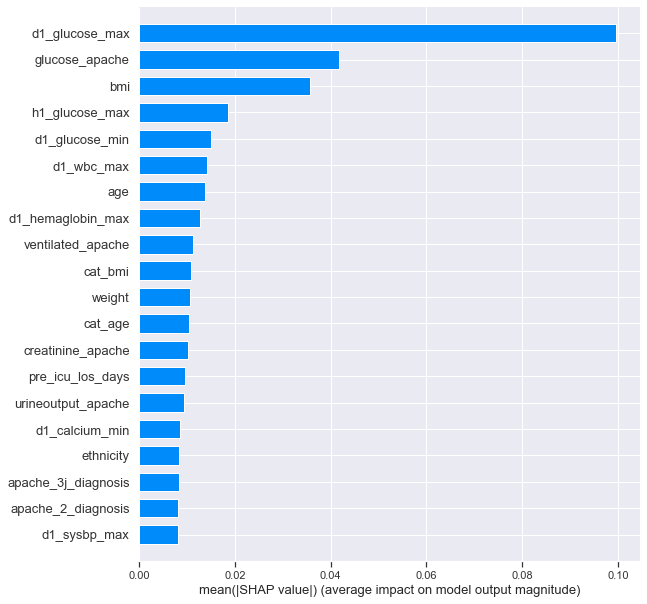

In [94]:
import shap
explainer = shap.TreeExplainer(model1)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar",
                  title = "",feature_names = test_df.columns.tolist())

In [95]:
import operator
def feature_rank(output):
    rank = model1.get_fscore()
    rank_sort = sorted(rank.items(), key=operator.itemgetter(1))
    rank_sort.reverse()
    for f in rank_sort:
        output += str(f)
    return output
feature_rank("submission1.csv")

"submission1.csv('f65', 1734)('f2', 1658)('f22', 1487)('f66', 1413)('f11', 1168)('f17', 1142)('f0', 1102)('f10', 1007)('f16', 971)('f13', 949)('f76', 946)('f71', 885)('f42', 860)('f78', 856)('f69', 854)('f77', 823)('f24', 812)('f12', 805)('f23', 804)('f43', 798)('f34', 739)('f48', 737)('f56', 733)('f26', 695)('f70', 682)('f46', 674)('f47', 652)('f27', 643)('f32', 638)('f57', 635)('f30', 634)('f7', 630)('f64', 620)('f49', 617)('f53', 611)('f44', 610)('f33', 603)('f39', 596)('f35', 595)('f72', 595)('f36', 574)('f38', 561)('f73', 558)('f51', 545)('f63', 525)('f37', 525)('f41', 520)('f45', 520)('f52', 502)('f68', 493)('f67', 491)('f50', 466)('f74', 465)('f1', 447)('f55', 434)('f75', 408)('f5', 405)('f28', 398)('f3', 394)('f29', 388)('f59', 370)('f9', 351)('f54', 328)('f58', 314)('f31', 300)('f62', 290)('f60', 240)('f6', 226)('f21', 220)('f61', 211)('f18', 187)('f40', 175)('f15', 159)('f19', 145)('f25', 127)('f86', 106)('f4', 43)('f80', 27)('f14', 25)('f8', 24)('f82', 8)('f20', 8)('f81', 7)

<Figure size 2160x1800 with 0 Axes>

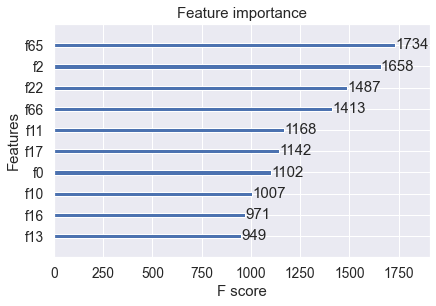

In [96]:
plt.figure(figsize=(30, 25))
xgb.plot_importance(model1, max_num_features=10) # top 10 most important features
plt.show()

In [97]:
# filename = "best_lgbm_3.pkl"
# joblib.dump(model2, filename) 